<a href="https://colab.research.google.com/github/MattValSE/AutoML2024_Team5/blob/main/Projekt2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Currently the best performing graph is Inductive with a noise threshold of 0.1

In [4]:
!pip install pm4py
!pip install graphviz

In [5]:
import pm4py
import json  # To store start and end activities as JSON

def import_xes(file_path):
    # Import the XES file
    event_log = pm4py.read_xes(file_path)

    # Get start and end activities
    start_activities = pm4py.get_start_activities(event_log)
    end_activities = pm4py.get_end_activities(event_log)

    # Print the results
    print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

    # Store the results
    pm4py.write_xes(event_log, "event_log.xes")  # Save the event log to a new XES file
    with open("start_activities.json", "w") as start_file:
        json.dump(start_activities, start_file, indent=4)
    with open("end_activities.json", "w") as end_file:
        json.dump(end_activities, end_file, indent=4)

    # Return the data for further processing
    return event_log, start_activities, end_activities

if __name__ == "__main__":
    # File path to the XES file
    file_path = "PrepaidTravelCost.xes"

    # Import the XES file and store the data
    event_log, start_activities, end_activities = import_xes(file_path)


/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:82: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


parsing log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

Start activities: {'Permit SUBMITTED by EMPLOYEE': 1859, 'Request For Payment SUBMITTED by EMPLOYEE': 233, 'Request For Payment SAVED by EMPLOYEE': 7}
End activities: {'Permit REJECTED by MISSING': 10, 'Payment Handled': 1970, 'Request For Payment REJECTED by MISSING': 7, 'Request For Payment REJECTED by EMPLOYEE': 72, 'Request For Payment SAVED by EMPLOYEE': 20, 'Permit FINAL_APPROVED by DIRECTOR': 6, 'Permit FINAL_APPROVED by SUPERVISOR': 12, 'Request For Payment REJECTED by ADMINISTRATION': 1, 'Request Payment': 1}


exporting log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

## Alpha_Miner

In [6]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_alpha(event_log)

# Visualize the Petri net
gviz = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)


In [7]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0,
 'average_trace_fitness': 0.45522736917670575,
 'log_fitness': 0.4702681384715757,
 'percentage_of_fitting_traces': 0.0}

## Heuristics

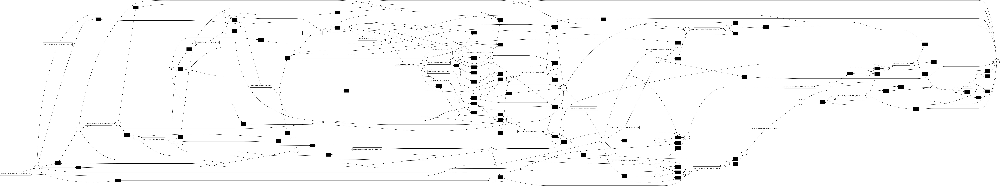

In [8]:
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(event_log)

# Visualize the Petri net
gviz_Heur = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [9]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 23.392091472129586,
 'average_trace_fitness': 0.8940378268550863,
 'log_fitness': 0.9016178004778507,
 'percentage_of_fitting_traces': 23.392091472129586}

In [10]:
import pandas as pd
# Define the thresholds you want to test
dependency_threshold = [0.1,0.3, 0.5, 0.8]
and_threshold = [0.3, 0.65, 1.0,2.0]

# List to store results
results = []

# Loop through the noise thresholds
for threshold in dependency_threshold:
    for th in and_threshold:
    # Discover a Petri net using the Inductive Miner with the given noise threshold
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(
            event_log, dependency_threshold = threshold, and_threshold = th
        )

    # Evaluate fitness
        fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
        average_fitness = fitness['average_trace_fitness']
        perc_fit_traces = fitness['perc_fit_traces']

    # Store the results
        results.append({
            "dependency_threshold": threshold,
            "and_threshold" : th,
            "average_trace_fitness": average_fitness,
            "perc_fit_traces": perc_fit_traces,
            "net": net,  # Optional: Store the Petri net for further use
            "initial_marking": initial_marking,
            "final_marking": final_marking
        })

# Convert results to a Pandas DataFrame
df = pd.DataFrame(results)

# Sort the DataFrame by highest average_trace_fitness
df = df.sort_values(by="average_trace_fitness", ascending=False)

# Display the DataFrame
print(df)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

    dependency_threshold  and_threshold  average_trace_fitness  \
3                    0.1           2.00               0.949283   
7                    0.3           2.00               0.949283   
11                   0.5           2.00               0.949172   
15                   0.8           2.00               0.948008   
0                    0.1           0.30               0.905506   
4                    0.3           0.30               0.905453   
12                   0.8           0.30               0.903517   
8                    0.5           0.30               0.901735   
2                    0.1           1.00               0.898154   
6                    0.3           1.00               0.898154   
10                   0.5           1.00               0.897967   
14                   0.8           1.00               0.896196   
1                    0.1           0.65               0.894237   
5                    0.3           0.65               0.894237   
9         

## Inductive

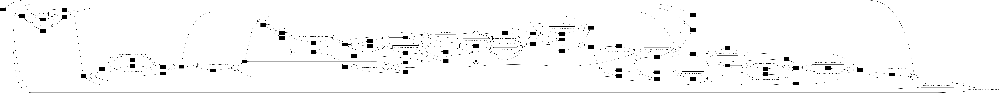

In [11]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [12]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 3.906622201048118,
 'average_trace_fitness': 0.9863028330128115,
 'log_fitness': 0.9865754284763762,
 'percentage_of_fitting_traces': 3.906622201048118}

The perc_fit_traces is not as as important compared to average_trace_fitness, because overall this model should be the best due to its average_trace_fitness.
It just isn't correct entirely, but has parts that are in error. Overall fitness is still very good.

In [13]:
import pandas as pd
# Define the thresholds you want to test
noise_thresholds = [0.0, 0.1, 0.2]

# List to store results
results = []

# Loop through the noise thresholds
for threshold in noise_thresholds:
    # Discover a Petri net using the Inductive Miner with the given noise threshold
    net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(
        event_log, noise_threshold = threshold
    )

    # Evaluate fitness
    fitness = pm4py.conformance.fitness_token_based_replay(event_log, net, initial_marking, final_marking)
    average_fitness = fitness['average_trace_fitness']
    perc_fit_traces = fitness['perc_fit_traces']

    # Store the results
    results.append({
        "noise_threshold": threshold,
        "average_trace_fitness": average_fitness,
        "perc_fit_traces": perc_fit_traces,
        "net": net,  # Optional: Store the Petri net for further use
        "initial_marking": initial_marking,
        "final_marking": final_marking
    })

# Convert results to a Pandas DataFrame
df = pd.DataFrame(results)

# Sort the DataFrame by highest average_trace_fitness
df = df.sort_values(by="average_trace_fitness", ascending=False)

# Display the DataFrame
print(df)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

   noise_threshold  average_trace_fitness  perc_fit_traces  \
0              0.0               0.986303         3.906622   
1              0.1               0.979408        74.035255   
2              0.2               0.950238        54.645069   

                                                 net initial_marking  \
0  places: [ p_11, p_12, p_13, p_14, p_15, p_16, ...     {source: 1}   
1  places: [ p_10, p_13, p_14, p_16, p_17, p_18, ...     {source: 1}   
2  places: [ p_10, p_11, p_13, p_14, p_17, p_18, ...     {source: 1}   

  final_marking  
0     {sink: 1}  
1     {sink: 1}  
2     {sink: 1}  


In [14]:

train_df, test_df = pm4py.ml.split_train_test(event_log)

##  Redundant Visualizations

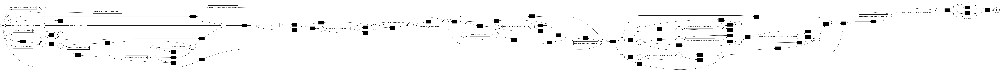

In [16]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log, noise_threshold=0.1)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [17]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 74.03525488327774,
 'average_trace_fitness': 0.9794079675044847,
 'log_fitness': 0.9860569052957064,
 'percentage_of_fitting_traces': 74.03525488327774}

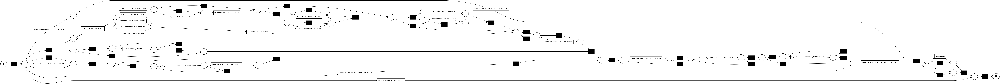

In [18]:

#from pm4py.visualization.petrinet import visualizer as pn_visualizer

# Discover process model using Alpha Miner
net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(event_log,noise_threshold=0.2)

# Visualize the Petri net
gviz_Ind = pm4py.vis.view_petri_net(net, initial_marking, final_marking)
#pn_visualizer.view(gviz)

In [19]:
pm4py.conformance.fitness_token_based_replay(event_log,net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/202 [00:00<?, ?it/s]

{'perc_fit_traces': 54.64506908051453,
 'average_trace_fitness': 0.9502384662175077,
 'log_fitness': 0.965419281357544,
 'percentage_of_fitting_traces': 54.64506908051453}